# Fake Image Detection

In this technological era, social media has a major role in people’s daily life. Most people share text, images, and videos on social media frequently. Images are one of the most common types of media shared among users on social media. So, there is a need for monitoring of images contained in social media. It has become easy for individuals and small groups to fabricate these images and disseminate them widely in a very short time, which threatens the credibility of the news and public confidence in the means of social communication. Instagram is one of the most important websitesand mobile image sharing applications on social media. This allows users to take photos, add digital photographic filters and upload pictures.

This project aims to build a model that can be used to classify forged/real images.

### So, how am I planning on doing this?

Apparently, without pre-processing the images first, the classification would be a hard task. So, I went online and did some reading and I found out that for starters, what I should do is learn about Error Level Analysis (ELA)!

According to Wikipedia "Error level analysis (ELA) is the analysis of compression artifacts in digital data with lossy compression such as JPEG". Simply put, it is a forensic method to identify portions of an image that has different levels of compression. It will allow us to see areas of a photo that has been altered or changed. We can use this technique to determine if a picture has been digitally modified. The added fake contents (layers) on top of an image is different from that of the original image and most importantly, ELA can detect this. If an image has not been modified, the altered grid should be at a higher error potential in respect to the remaining part of the image.

Once I'll be done with the ELA pre-processing I'll try different classification models and see which one will get me the best results:

* Logistic Regression
* Random Forest
* Gradient Boosting
* XGBoost
* Random Forest with Gradient Boosting
* Convolutional Neural Network

Let's just see a quick demonstration of how an image looks like once it's been pre-processed with ELA.


Here's a pristine image before ELA:

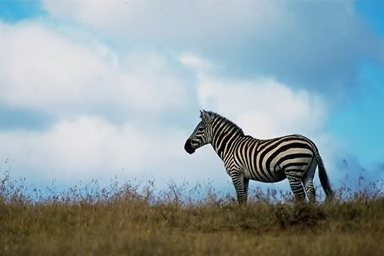

In [1]:
from PIL import Image, ImageChops, ImageEnhance

Image.open("C:\\Users\\Lidor\\Documents\\project\\zebra - real.png")

Here's the same image after ELA:

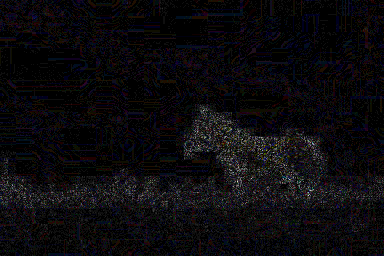

In [2]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\zebra - real ela.png")


Now let's do the same for a fake image this time, here's the image before ELA:

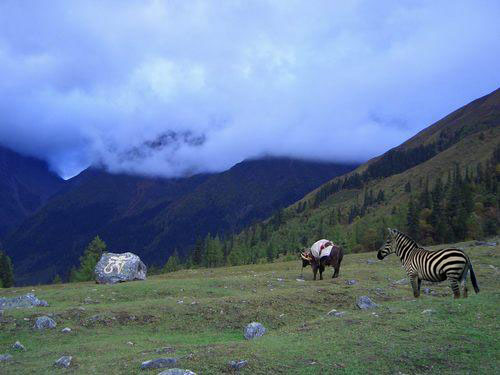

In [3]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\zebra - fake.png")


And here it is after ELA:

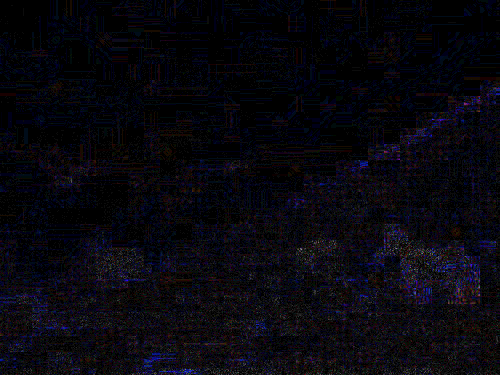

In [4]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\zebra - fake ela.png")


Hopefully, this will help our model to distinguish the real images from the fake ones.

## Libraries

In [33]:
import pandas as pd
import os
import sys
from imgurpython import ImgurClient
from imgurpython.helpers.error import ImgurClientError
import urllib
from PIL import Image, ImageChops, ImageEnhance
import cv2
import numpy as np
from math import sqrt
import datetime
from skimage.data import imread
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.metrics import roc_curve, roc_auc_score, auc, mean_squared_error, classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from skimage.transform import resize
from numpy.linalg import svd
from skimage import io
import matplotlib.pyplot as plt
import warnings

from xgboost import XGBClassifier

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten, Dropout
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from keras.utils import np_utils
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import seaborn as sns

import pickle
import errno

Using TensorFlow backend.
C:\Users\Lidor\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [83]:
warnings.filterwarnings('ignore')

## Datasets

For this project I'm going to be using two different datasets.
Why use different datasets? at first I only wanted to play with a photoshopped dataset (I'll address its source in a few rows) against a pristine images dataset of images that I have taken over the years. BUT!! This is not good enough, what if the model detects something other than the fake/pristine characteristics? This is why I'll be using another dataset, one of pristine face images vs fake face images - a dataset that I didn't create, but already existed.

### Photoshop VS Images Iv'e take - Dataset I

For the pristine images I used photos that I have taken over the years - all of which have not been edited in any sort of way. Wer'e talking about ~900 images. For the fake images I was up for a bit more work. I searched online where could I find a decent number of edited images, that's when I found the Photoshop Battles page on Imgur - jackpot!

I found fake images, great, now it's time to download them all. After a bit more of investigating I found that this was an easy task by using Imgur API with an existing Imgur Python library (ImgurPython). I wrote a simple script to extract about 1500 images:

In [7]:

OUTPUT_PATH = "C:\\Users\\Lidor\\Documents\\project\\imgur\\"
CSV_OUTPUT_PATH = OUTPUT_PATH+"test.csv"

client_id = 'ca28e0eca0550d9'
client_secret = '6f0ca5af621994b374056f147b3ae951c0788006'
client = ImgurClient(client_id, client_secret)

imgur_df = pd.DataFrame(columns=['title', 'description', 'img_type', 'url', 'datetime'])
page = 1
force_stop = False
error = None


def passes_imgur_filter(title, desc):
    if desc and desc.lower().find("original") != -1:
        return False
    if title and title.lower().find("original") != -1:
        return False
    return True


while imgur_df.shape[0] < 1500 and not force_stop:
    tags = client.gallery_tag('photoshop_battles',sort='all', window='time', page=page)

    if tags.items is None:
        force_stop = True
        break

    for item in tags.items:
        if hasattr(item, 'type') and item.type == 'image/jpeg':
            if passes_imgur_filter(item.title, item.description):
                data = [
                    item.title,
                    item.description,
                    item.type,
                    item.link,
                    item.datetime
                ]
                imgur_df.loc[item.id] = data


        if hasattr(item, 'images') and len(item.images) > 0:
            for images in item.images:
                if images['type'] == 'image/jpeg':
                    if passes_imgur_filter(images['title'], images['description']):
                        data = [
                                images['title'],
                                images['description'],
                                images['type'],
                                images['link'],
                                images['datetime']
                            ]
                        imgur_df.loc[images['id']] = data
    page += 1



imgur_df.to_csv(CSV_OUTPUT_PATH, encoding='utf-8', index=True)
print("Total: ", imgur_df.shape[0], " images")
print("Output to ", CSV_OUTPUT_PATH)

df = pd.read_csv(CSV_OUTPUT_PATH, index_col=0)
df = df.reset_index()
df['file_name'] = df['index']


def images_from_file_path(file_path):
    file_names = os.listdir(file_path)
    return file_names

output_images = images_from_file_path(OUTPUT_PATH)

downloaded_count = 0
for idx, vals in df.iterrows():
    url = vals['url']
    filename = str(vals['file_name']) + '.jpg'
    if filename not in output_images:
        path = OUTPUT_PATH + filename
        urllib.request.urlretrieve(url, path)
        downloaded_count += 1

print("Finished Downloading Total of: ", downloaded_count)

Total:  1528  images
Output to  C:\Users\Lidor\Documents\project\imgur\test.csv
Finished Downloading Total of:  12


(The total downloaded says 12 but actually the real number is 1528... I ran the script as I was writing it and I didn't want to re-download everyhthing)

Here's a sample of a photoshopped image:

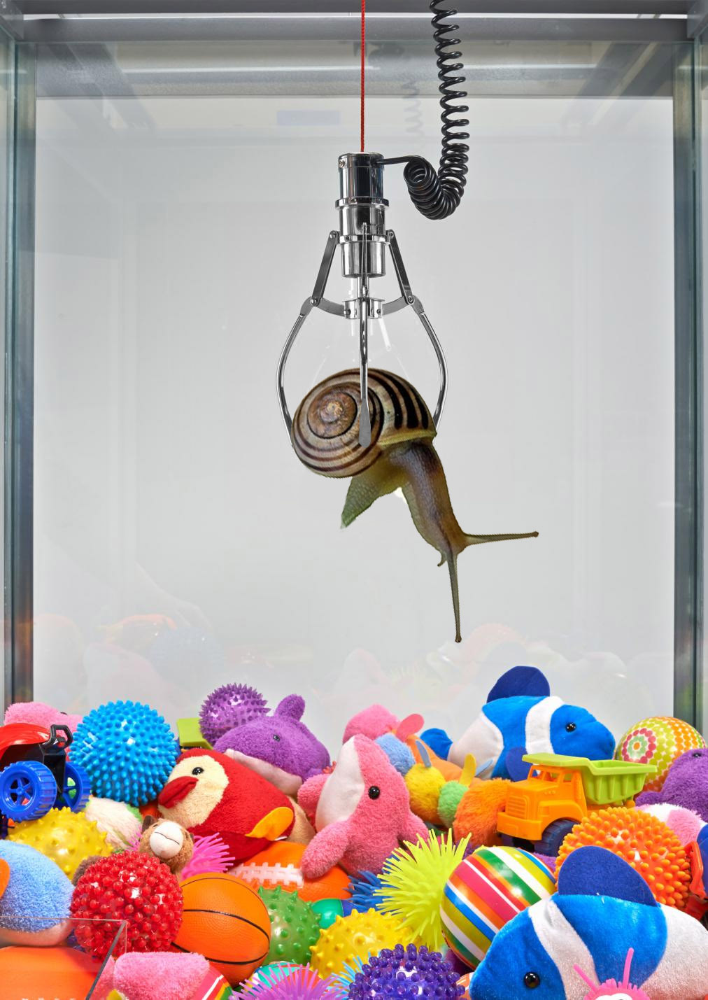

In [19]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\imgur\\0F3Sz5p.jpg")

Here's a sample of a pristine image taken by me:

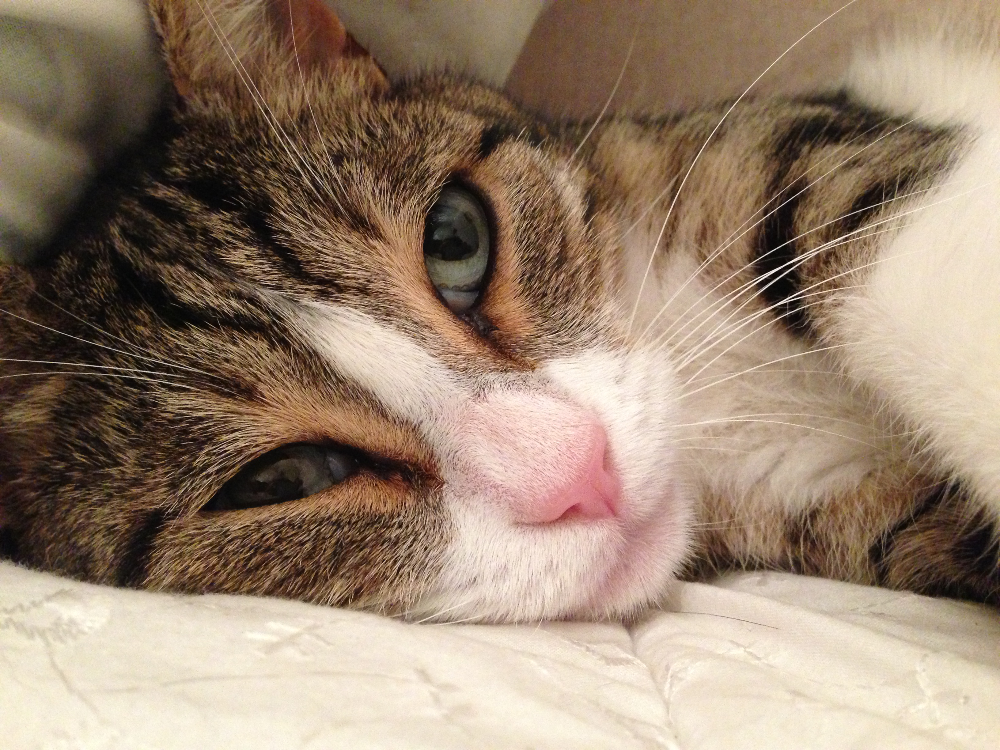

In [20]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\pristine\\IMG_0305.jpg")

Overall:
    
~1500 fake

~900 pristine

### Real VS Fake Face Images - Dataset II

This is a dataset that I found on Kaggle. To make things clear and simple, here is the discription of the dataset as described on Kaggle:
    
Our dataset contains expert-generated high-quality photoshopped face images.
The images are composite of different faces, separated by eyes, nose, mouth, or whole face.
You may wonder why we need these expensive images other than images automatically generated by computers.
Say we want to train a classifier for real and fake face images.
In case of generative models like Generative Adversarial Networks (GAN), it is very easy to generate fake face images.
Then, a classifier can be trained using those images, and they do great job discriminating real and generated face images.
We can easily assume that the classifier learns some kind of pattern between images generated by GANs.
However, those patterns can be futile in front of human experts, since exquisite counterfeits by experts are created in completely different process.
Thus we had to create our own dataset with expert level fake face photos.
Inside the parent directory, training_real/training_fake contains real/fake face photos, respectively.
In case of fake photos, we have three groups; easy, mid, and hard

Great! We found a dataset of fake vs real face images. Not only that we got a dataset, but these images are even categorized according to the difficulty in distinguishing them! Let's have a look at what would be tagged as "easy"/"mid"/"hard".

Fake image tagged as "easy":

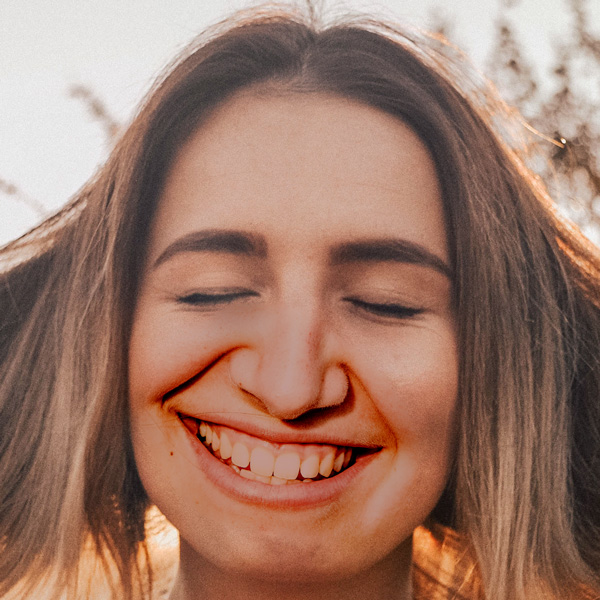

In [10]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\faces - fake\\easy_4_0011.jpg")

I guess we can all see what's been edited in this one...

Fake image tagged as "mid":

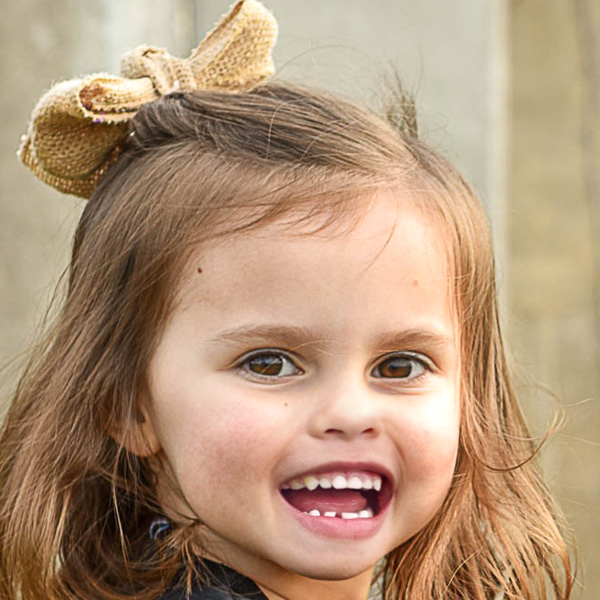

In [11]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\faces - fake\\mid_448_0011.jpg")

Fake image tagged as "hard":

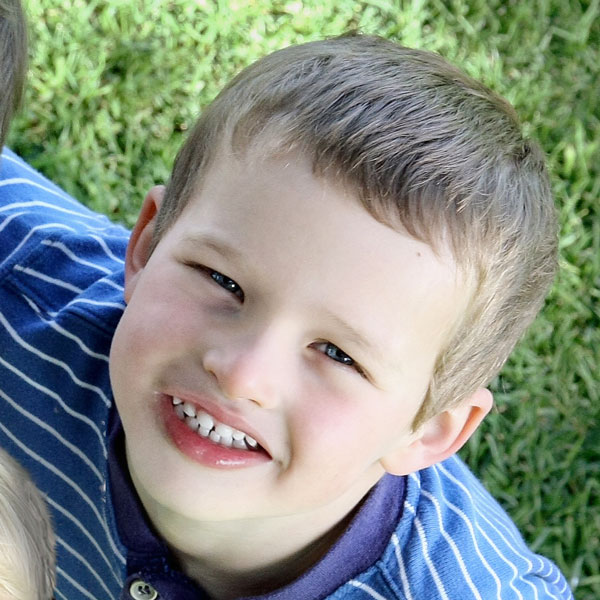

In [12]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\faces - fake\\hard_54_0001.jpg")

Honestly I can't even spot the edit in this one (the mouth maybe?), just as the tag said, it's harder to detect.

And here's an image from the "real" images set:

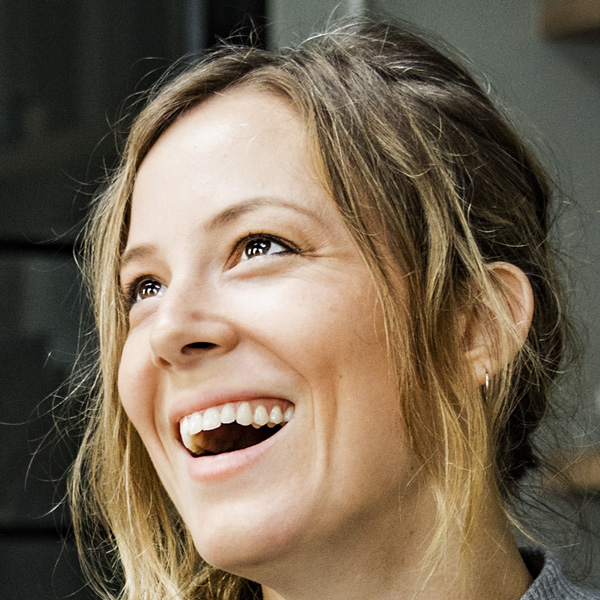

In [15]:
Image.open("C:\\Users\\Lidor\\Documents\\project\\faces - real\\real_00003.jpg")

Ovarall:

~1000 pristine images

~900 fake images

## ELA & Pre-processing

Here are the steps for this part:
    
1) ELA on all images

2) Resizing the images

3) Loading the pre-processed images

This is the ELA algorythm (it's an open-source algorythm):

In [29]:
PROJECT_DIR = "C:\\Users\\Lidor\\Documents\\project\\"
TMP_EXT = ".tmp_ela.jpg"
ELA_EXT = "_ela.png"

def get_remaining_images(input_images, output_images):
    input_images = map(lambda x: x.split('.jpg')[0], input_images)
    output_images = map(lambda x: x.split('_ela.png')[0], output_images)
    return [input_image for input_image in input_images if input_image not in output_images]

def configure_ext(path, name, extension):
    filepath = path + name
    filename, file_extension = os.path.splitext(filepath)
    return filename + extension

def configure_images_file_paths(path, file_names, extension='.jpg'):
    file_paths = (map(lambda name: configure_ext(path, name, extension), file_names))
    return file_paths


def ela(orig_path, save_path, temp_path):
    im = Image.open(orig_path)
    im.save(temp_path, 'JPEG', quality=90)

    tmp_fname_im = Image.open(temp_path)
    ela_im = ImageChops.difference(im, tmp_fname_im)

    extrema = ela_im.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    scale = 255.0/max_diff
    ela_im = ImageEnhance.Brightness(ela_im).enhance(scale)
    os.remove(temp_path)

    ela_im.save(save_path)

def ela_all_images(dirc, ela_dirc):
    input_images = [image for image in os.listdir(dirc)]
    output_images = [image for image in os.listdir(ela_dirc)]
    remaining_images = get_remaining_images(input_images, output_images)

    input_image_paths = configure_images_file_paths(dirc, remaining_images)
    temp_image_paths = configure_images_file_paths(dirc, remaining_images, TMP_EXT)
    output_image_paths = configure_images_file_paths(ela_dirc, remaining_images, ELA_EXT)
    paths = zip(input_image_paths, temp_image_paths, output_image_paths)

    try:
        for i, (input_image_path, temp_path, output_image_path) in enumerate(paths):
            ela(input_image_path, output_image_path, temp_path)
    except OSError:
        print('error --- ', input_image_path)

Resizing images is a critical preprocessing step in computer vision. Our machine learning models train faster on smaller images and sometimes we'd rather have all images sized equally. Image resizing:



In [17]:
def configure_ext(path, name, extension):
    filepath = path + name
    filename, file_extension = os.path.splitext(filepath)
    return filename + extension

def images_from_file_path(file_path):
    file_names = os.listdir(file_path)
    images = [image for image in file_names]
    return images

def resize_image(input_image_path, output_image_path):
    image_size = 128, 128
    img_data = cv2.imread(input_image_path, 0)
    img_data = cv2.resize(img_data, image_size)
    img = Image.fromarray(img_data)
    img.save(output_image_path)

def resizing(input_path, output_path):
    input_images = images_from_file_path(input_path)
    output_images = images_from_file_path(output_path)
    remaining_images = [input_image for input_image in input_images if input_image not in output_images]

    input_image_paths = configure_images_file_paths(input_path, remaining_images, '.png')
    output_image_paths = configure_images_file_paths(output_path, remaining_images, '.png')

    paths = zip(input_image_paths, output_image_paths)

    for index, (input_image_path, output_image_path) in enumerate(paths):
        resize_image(input_image_path, output_image_path)
    print("ELA Images at: ", output_path)

And finally loading the images:

In [227]:
def read_image(path):
    # reading the image as png to preserve image's pixel values
    img_data = cv2.imread(path, 0)
    img_data = img_data.reshape(128 * 128)
    return img_data

def load_images(folder, cat=None):
    if cat:
        image_files = [file for file in os.listdir(folder) if (file.endswith('.jpg') or file.endswith('.JPG') or file.endswith('.png')) and cat in file]
    else:
        image_files = [file for file in os.listdir(folder) if file.endswith('.jpg') or file.endswith('.JPG') or file.endswith('.png')]
    images = np.empty((len(image_files), 128 * 128), dtype=np.float32)       
    for i, file_name in enumerate(image_files):
        try:
            image = read_image(''.join([folder, file_name]))
            images[i] = image
        except AttributeError:
            print("ERROR ---- ", ''.join([folder, file_name]))
            
    return images

### Pre-processing Dataset I

In [36]:
ds1_fake = PROJECT_DIR + "imgur\\"
ds1_fake_ela = PROJECT_DIR + "imgur_ela\\"
ds1_fake_done = PROJECT_DIR + "imgur_resized\\"
ds1_pristine = PROJECT_DIR + "pristine\\"
ds1_pristine_ela = PROJECT_DIR + "pristine_ela\\"
ds1_pristine_done = PROJECT_DIR + "pristine_resized\\"


ela_all_images(ds1_fake, ds1_fake_ela)
ela_all_images(ds1_pristine, ds1_pristine_ela)

resizing(ds1_fake_ela, ds1_fake_done)
resizing(ds1_pristine_ela, ds1_pristine_done)

ds1_fake_images = load_images(ds1_fake_done)
ds1_pristine_images = load_images(ds1_pristine_done)

error ---  C:\Users\Lidor\Documents\project\imgur\2azT7SG.jpg
ELA Images at:  C:\Users\Lidor\Documents\project\imgur_resized\
ELA Images at:  C:\Users\Lidor\Documents\project\pristine_resized\


type
fake        1533
pristine     896
Name: count, dtype: int64


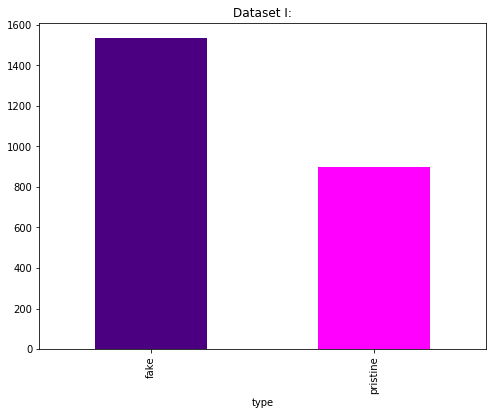

In [39]:
types = ['fake', 'pristine']
counts = [ds1_fake_images.shape[0], ds1_pristine_images.shape[0]]

df = pd.DataFrame({
    'count': counts,
    'type': types
})

group = df.groupby(['type'])['count'].sum()
ax = group.plot(
    kind='bar', 
    color=["indigo", "magenta"], 
    figsize=(8,6), 
    title='Dataset I:'
)
print(group)
fig = ax.get_figure()

### Pre-processing Dataset II

In [40]:
ds2_fake = PROJECT_DIR + "faces - fake\\"
ds2_fake_ela = PROJECT_DIR + "faces - fake ela\\"
ds2_fake_done = PROJECT_DIR + "faces - fake resized\\"
ds2_pristine = PROJECT_DIR + "faces - real\\"
ds2_pristine_ela = PROJECT_DIR + "faces - real ela\\"
ds2_pristine_done = PROJECT_DIR + "faces - real resized\\"

ela_all_images(ds2_fake, ds2_fake_ela)
ela_all_images(ds2_pristine, ds2_pristine_ela)

In [41]:
resizing(ds2_fake_ela, ds2_fake_done)
resizing(ds2_pristine_ela, ds2_pristine_done)

ELA Images at:  C:\Users\Lidor\Documents\project\faces - fake resized\
ELA Images at:  C:\Users\Lidor\Documents\project\faces - real resized\


In [42]:
ds2_fake_images = load_images(ds2_fake_done)
ds2_pristine_images = load_images(ds2_pristine_done)

type      source     
fake      Fake - Easy     240
          Fake - Hard     240
          Fake - Mid      480
pristine  Pristine       1081
Name: count, dtype: int64


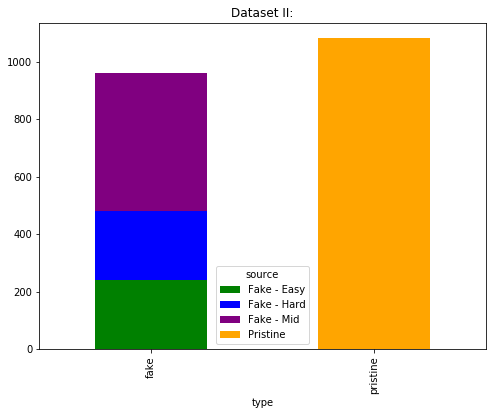

In [52]:
sources = ['Fake - Easy', 'Fake - Mid', 'Fake - Hard', 'Pristine']
types = ['fake', 'fake', 'fake', 'pristine']

fake_easy=load_images(ds2_fake_done, "easy")
fake_mid=load_images(ds2_fake_done, "mid")
fake_hard=load_images(ds2_fake_done, "hard")

counts = [fake_easy.shape[0], fake_mid.shape[0], fake_hard.shape[0], ds2_pristine_images.shape[0]]

df = pd.DataFrame({
    'source': sources,
    'count': counts,
    'type': types
})

group = df.groupby(['type', 'source'])['count'].sum()
ax = group.unstack().plot(
    kind='bar', 
    stacked=True, 
    color=['green', 'blue', 'purple', 'orange'], 
    figsize=(8,6), 
    title='Dataset II:'
)
print(group)
fig = ax.get_figure()

## Helpfull Functions for Analyzing the Data

In [28]:
def plot_roc_curve(y_true, y_pred, y_proba):

    
    FPR, TPR, thresholds = roc_curve(y_true, y_proba)
    roc_auc = auc(FPR, TPR)
    plt.plot([0, 1], [0, 1], 'r--')
    plt.plot(FPR, TPR, label='AUC = %0.2f' % roc_auc)
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.ylabel('True Positive')
    plt.xlabel('False Positive')
    plt.show()
    
    plot_confusion_matrix(y_true, y_pred)
    print('----' * 15)
    print(classification_report(y_true, y_pred))
    
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn,fp,fn,tp = cm.ravel()
    print('TP',tp)
    print('TN',tn)
    print('FP',fp)
    print('FN',fn)

    plt.matshow(cm.T)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('True label')
    plt.ylabel('Predicted label')
    
    print('top left: TN')
    print('bottom left: FP')
    print('top right: FN')
    print('bottom right: TP')

In [29]:
def plot_roc_multi(X_test, y_true, X_test_keras, y_true_keras, models):
    plt.figure(figsize=(10,6))
    for name, model in models.items():
        if name == 'CNN':
            proba = model.predict(X_test_keras)
            prediction = model.predict_classes(X_test_keras)
            fpr, tpr, thresh = roc_curve(y_true_keras, proba)
            accuracy = accuracy_score(y_true_keras, prediction)
        else:
            proba = model.predict_proba(X_test)[:, 1]
            prediction = model.predict(X_test)
            fpr, tpr, thresh = roc_curve(y_true, proba)
            accuracy = accuracy_score(y_true, prediction)
        label = "%s - Accuracy %0.2f" % (name, accuracy)
        plt.plot(fpr, tpr, label=label)
        

    # 45 degree line
    xx = np.linspace(0, 1.0, 20)
    plt.plot(xx, xx)

    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.title("ROC curves")
    plt.legend()

In [30]:
 def show_score(model):
    score_test = model.score(X_test, y_test)
    print('Test Score', score_test)

## Models

### Dataset I - Photoshop VS Photos Taken by Me

In [64]:
X = np.concatenate((ds1_fake_images,
                    ds1_pristine_images,
                   ))
y = np.concatenate((np.repeat(1, len(ds1_fake_images)),
                    np.repeat(0, len(ds1_pristine_images)),
                   ))

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=.2)

#### Logistic Regression

In [84]:
lr = LogisticRegression(penalty='l2')
lr.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [85]:
lr.score(X_test, y_test)

0.8106995884773662

In [86]:
lr_y_prob = lr.predict_proba(X_test)[:,1]
lr_y_pred = lr.predict(X_test)

Test Score 0.8106995884773662
RMSE 0.4350866712766937


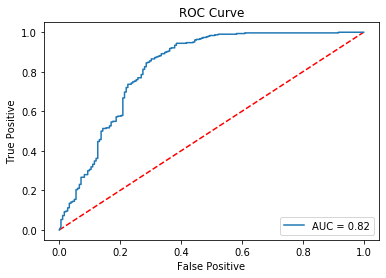

TP 281
TN 113
FP 69
FN 23
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.62      0.71       182
           1       0.80      0.92      0.86       304

    accuracy                           0.81       486
   macro avg       0.82      0.77      0.79       486
weighted avg       0.81      0.81      0.80       486



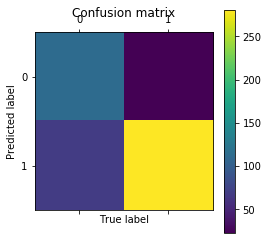

In [87]:
show_score(lr)
plot_roc_curve(y_test, lr_y_pred, lr_y_prob)

#### Random Forest

In [96]:
rf = RandomForestClassifier(criterion='entropy', n_estimators=500, n_jobs=-1)
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

Test Score 0.7962962962962963
RMSE 0.45133546692422


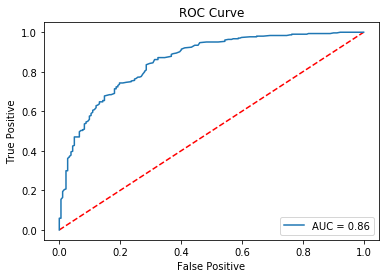

TP 278
TN 109
FP 73
FN 26
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.60      0.69       182
           1       0.79      0.91      0.85       304

    accuracy                           0.80       486
   macro avg       0.80      0.76      0.77       486
weighted avg       0.80      0.80      0.79       486



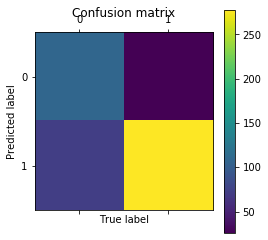

In [97]:
rf_y_proba = rf.predict_proba(X_test)[:,1]
rf_y_pred = rf.predict(X_test)


show_score(rf)
plot_roc_curve(y_test, rf_y_pred, rf_y_proba)

#### Gradient Boosting

In [91]:
gb = GradientBoostingClassifier(n_estimators=500)
gb.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

Test Score 0.8497942386831275
RMSE 0.38756388030474725


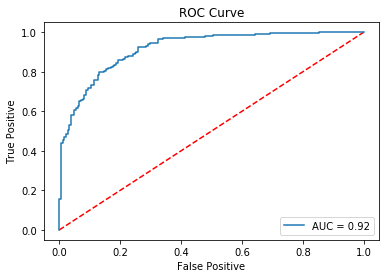

TP 284
TN 129
FP 53
FN 20
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.71      0.78       182
           1       0.84      0.93      0.89       304

    accuracy                           0.85       486
   macro avg       0.85      0.82      0.83       486
weighted avg       0.85      0.85      0.85       486



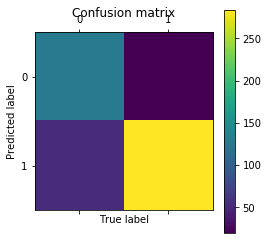

In [98]:
gb_y_proba = gb.predict_proba(X_test)[:,1]
gb_y_pred = gb.predict(X_test)


show_score(gb)
plot_roc_curve(y_test, gb_y_pred, gb_y_proba)

#### XGBoost

In [106]:
xg = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
            colsample_bytree=0.5, gamma=0.4, learning_rate=0.28, max_delta_step=0.06,
           max_depth=7, min_child_weight=2, missing=1, n_estimators=470,
           n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
           reg_alpha=0.0083, reg_lambda=1, scale_pos_weight=1, seed=42, 
           silent=True, subsample=0.7)
xg.fit(X_train, y_train)


[15:56:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:56:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.4, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.28, max_delta_step=0.06, max_depth=7,
              min_child_weight=2, missing=1, monotone_constraints='()',
              n_estimators=470, n_jobs=1, nthread=1, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0.0083,
              reg_lambda=1, scale_pos_weight=1, seed=42, silent=True,
              subsample=0.7, tree_method='exact', use_label_encoder=True,
              validate_parameters=1, ...)

Test Score 0.8353909465020576
RMSE 0.40572041296678973


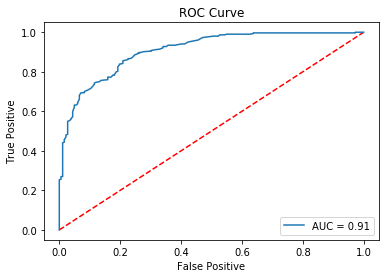

TP 274
TN 132
FP 50
FN 30
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.73      0.77       182
           1       0.85      0.90      0.87       304

    accuracy                           0.84       486
   macro avg       0.83      0.81      0.82       486
weighted avg       0.83      0.84      0.83       486



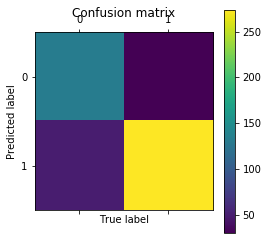

In [107]:
xg_y_proda = xg.predict_proba(X_test)[:, 1]
xg_y_pred = xg.predict(X_test)


show_score(xg)
plot_roc_curve(y_test, xg_y_pred, xg_y_proda)

#### Random Forest + Gradient Boosting

In [108]:
tree_pipeline = [
    ('rf', rf),
    ('gb', gb),
]
rf_gb = VotingClassifier(tree_pipeline, voting='soft')
rf_gb.fit(X_train, y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=None,
                                                     max_features='auto',
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     n_estimators=500,
                                                     n_jobs=-1, oob_score

In [109]:
rf_gb_y_proda = rf_gb.predict_proba(X_test)[:, 1]
rf_gb_y_pred = rf_gb.predict(X_test)

Test Score 0.845679012345679
RMSE 0.3928371006591931


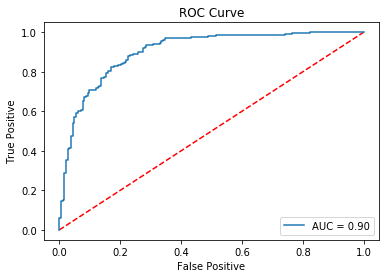

TP 285
TN 126
FP 56
FN 19
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.69      0.77       182
           1       0.84      0.94      0.88       304

    accuracy                           0.85       486
   macro avg       0.85      0.81      0.83       486
weighted avg       0.85      0.85      0.84       486



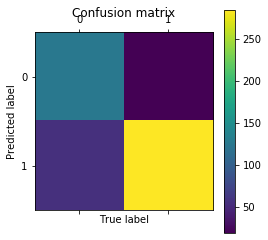

In [110]:
show_score(rf_gb)
plot_roc_curve(y_test, rf_gb_y_pred, rf_gb_y_proda)

#### Convolutional Neural Network

In [178]:
cnn = Sequential()
cnn.add(Conv2D(122, (3, 3), input_shape=(1, 124, 124), data_format='channels_first'))
cnn.add(Activation('relu'))
cnn.add(MaxPooling2D(pool_size=(2, 2)))
cnn.add(Dropout(0.35))

cnn.add(Conv2D(122, (3, 3)))
cnn.add(Activation('relu'))
cnn.add(MaxPooling2D(pool_size=(2, 2)))
cnn.add(Dropout(0.35))

# 2 Fully connected layers
cnn.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
cnn.add(Dense(64)) 
cnn.add(Activation('relu'))
cnn.add(Dropout(0.5))
cnn.add(Dense(1))
cnn.add(Activation('sigmoid'))

cnn.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [250]:
fake = PROJECT_DIR + "imgur_resized1\\"
real = PROJECT_DIR + "pristine_resized1\\"


def read_image_keras(path):
    img_data = cv2.imread(path, 0)
    img_data = cv2.resize(img_data, (124, 124))

    return img_data

def load_images_keras(folder, resize=False, n_files=None, for_keras=False):
    image_files = [file for file in os.listdir(folder) if file.endswith('.jpg') or file.endswith('.JPG') or file.endswith('.png')]
    images = np.empty((len(image_files), 124, 124),
                  dtype=np.float32)

    for i, file_name in enumerate(image_files):
        try:
            if resize:
                image = read_and_resize_image('/'.join([folder, file_name]))
            else:
                if for_keras:
                    image = read_image_keras('/'.join([folder, file_name]))
                else:
                    image = read_image('/'.join([folder, file_name]))
            images[i] = image
        except RuntimeError:
            print('error --- ', file_name)
    return images


def preprocess_keras(X, y):
    fake_image = load_images_keras(fake, for_keras=True)
    real_image = load_images_keras(real, for_keras=True)
    
    X_train_keras, X_test_keras, y_train_keras, y_test_keras = train_test_split(X, y, random_state=42, test_size=.2)
    
    X_train_keras = X_train_keras.reshape(X_train_keras.shape[0], 1, 128, 128)
    X_test_keras = X_test_keras.reshape(X_test_keras.shape[0], 1, 128, 128)

    X_train_keras = X_train_keras.astype('float32')
    X_test_keras = X_test_keras.astype('float32')

    print('------')
    print('X', X.shape)
    print('y', y.shape)
    return X_train_keras, X_test_keras, y_train_keras, y_test_keras

In [180]:
X_train_keras, X_test_keras, y_train_keras, y_test_keras = preprocess_keras(X, y)

------
X (2438, 124, 124)
y (2438,)


In [228]:

datagen = ImageDataGenerator(
    rotation_range=10,
    horizontal_flip=True,
    vertical_flip=True)

history = cnn.fit_generator(
    datagen.flow(X_train_keras, y_train_keras, batch_size=32),
    epochs=50,
    verbose=1,
    validation_data=(X_test_keras, y_test_keras) 
    )

  ...
    to  
  ['...']
Train for 61 steps, validate on 488 samples
Epoch 1/50
61/61 [==============================] - 438s 7s/step - loss: 0.2658 - accuracy: 0.8703 - val_loss: 0.4638 - val_accuracy: 0.7459
Epoch 2/50
61/61 [==============================] - 399s 7s/step - loss: 0.2549 - accuracy: 0.8764 - val_loss: 0.4719 - val_accuracy: 0.7623
Epoch 3/50
61/61 [==============================] - 390s 6s/step - loss: 0.2470 - accuracy: 0.8892 - val_loss: 0.5482 - val_accuracy: 0.7398
Epoch 4/50
61/61 [==============================] - 393s 6s/step - loss: 0.2620 - accuracy: 0.8703 - val_loss: 0.4811 - val_accuracy: 0.7500
Epoch 5/50
61/61 [==============================] - 397s 7s/step - loss: 0.2251 - accuracy: 0.8949 - val_loss: 0.5330 - val_accuracy: 0.7275
Epoch 6/50
61/61 [==============================] - 382s 6s/step - loss: 0.2295 - accuracy: 0.8959 - val_loss: 0.5573 - val_accuracy: 0.7480
Epoch 7/50
61/61 [==============================] - 385s 6s/step - loss: 0.2111 - acc

In [229]:
cnn.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 122, 122, 122)     1220      
_________________________________________________________________
activation_8 (Activation)    (None, 122, 122, 122)     0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 61, 61, 122)       0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 61, 61, 122)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 59, 59, 122)       134078    
_________________________________________________________________
activation_9 (Activation)    (None, 59, 59, 122)       0         
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 29, 29, 122)      

In [230]:
cnn_score = cnn.evaluate(X_test_keras, y_test_keras, verbose=1)

488/488 [==============================] - 26s 54ms/sample - loss: 0.9555 - accuracy: 0.7746


In [231]:
print('Test loss:', cnn_score[0])
print('Test accuracy:', cnn_score[1])

Test loss: 0.9555228420945464
Test accuracy: 0.77459013


In [232]:
cnn_model_y_proba = cnn.predict(X_test_keras, verbose=1)
cnn_model_y_pred = cnn.predict_classes(X_test_keras, verbose=1)

488/488 [==============================] - 29s 60ms/sample


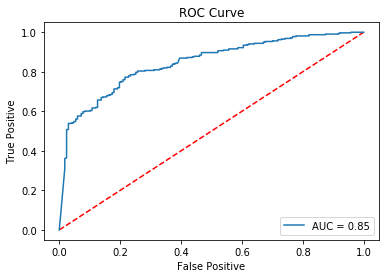

TP 279
TN 99
FP 68
FN 42
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.59      0.64       167
           1       0.80      0.87      0.84       321

    accuracy                           0.77       488
   macro avg       0.75      0.73      0.74       488
weighted avg       0.77      0.77      0.77       488



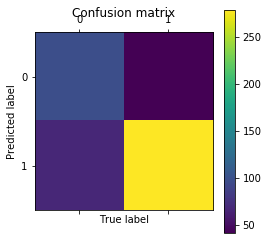

In [233]:
plot_roc_curve(y_test_keras, cnn_model_y_pred, cnn_model_y_proba)

## Dataset I - Summary

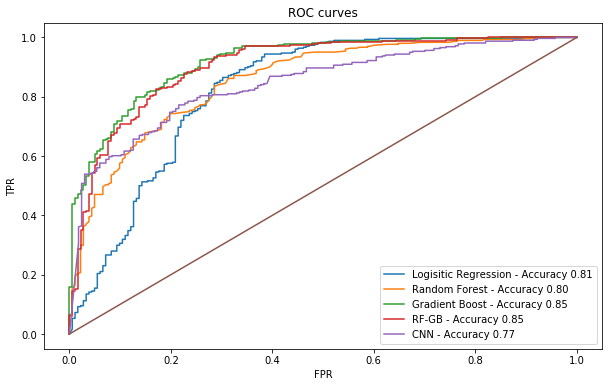

In [234]:
models = {
    "Logisitic Regression": lr,
    "Random Forest": rf, 
    "Gradient Boost": gb,
    "RF-GB": rf_gb,
    "CNN": cnn
}

plot_roc_multi(X_test, y_test, X_test_keras, y_test_keras, models)

So it seems that the model performed not too bad. BUT! i was warned that this dataset might not be good enough to test and classify the objective of this project, and so, let's jump to the second dataset and see whether the figures are matching

## Dataset II - Real VS Fake Face Images

### Easy Set - Logistic Regression

In [217]:
X_e = np.concatenate((fake_easy,
                    ds2_pristine_images[:len(fake_easy)],
                   ))
y_e = np.concatenate((np.repeat(1, len(fake_easy)),
                    np.repeat(0, len(ds2_pristine_images[:len(fake_easy)])),
                   ))

X_train_e, X_test_e, y_train_e, y_test_e = train_test_split(X_e, y_e, random_state=42, test_size=.2)

In [218]:
lr_e = LogisticRegression(penalty='l2')
lr_e.fit(X_train_e, y_train_e)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [219]:
lr_e.score(X_test_e, y_test_e)

0.5416666666666666

In [220]:
lr_y_prob_e = lr_e.predict_proba(X_test_e)[:,1]
lr_y_pred_e= lr_e.predict(X_test_e)

Test Score 0.5349794238683128


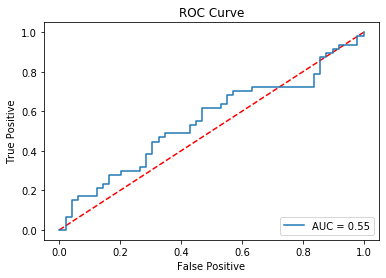

TP 29
TN 23
FP 26
FN 18
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.56      0.47      0.51        49
           1       0.53      0.62      0.57        47

    accuracy                           0.54        96
   macro avg       0.54      0.54      0.54        96
weighted avg       0.54      0.54      0.54        96



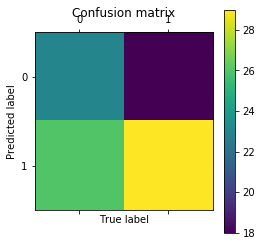

In [221]:
show_score(lr_e)
plot_roc_curve(y_test_e, lr_y_pred_e, lr_y_prob_e)

### Easy Set - Random Forest

In [222]:
rf_e = RandomForestClassifier(criterion='entropy', n_estimators=500, n_jobs=-1)
rf_e.fit(X_train_e, y_train_e)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

Test Score 0.4176954732510288


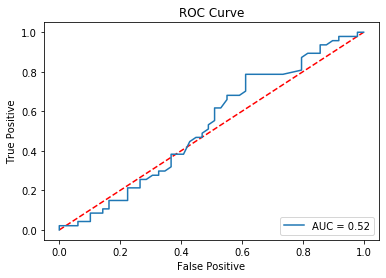

TP 45
TN 5
FP 44
FN 2
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.71      0.10      0.18        49
           1       0.51      0.96      0.66        47

    accuracy                           0.52        96
   macro avg       0.61      0.53      0.42        96
weighted avg       0.61      0.52      0.42        96



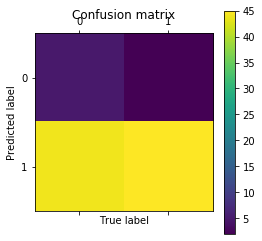

In [223]:
rf_y_proba_e = rf.predict_proba(X_test_e)[:,1]
rf_y_pred_e = rf.predict(X_test_e)


show_score(rf_e)
plot_roc_curve(y_test_e, rf_y_pred_e, rf_y_proba_e)

### Easy Set - Gradient Boosting

In [235]:
gb_e = GradientBoostingClassifier(n_estimators=500)
gb_e.fit(X_train_e, y_train_e)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

Test Score 0.44650205761316875


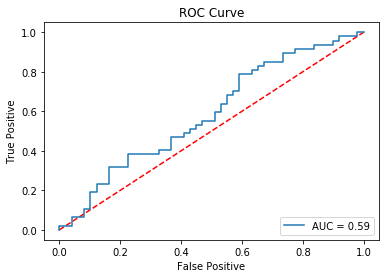

TP 26
TN 26
FP 23
FN 21
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.55      0.53      0.54        49
           1       0.53      0.55      0.54        47

    accuracy                           0.54        96
   macro avg       0.54      0.54      0.54        96
weighted avg       0.54      0.54      0.54        96



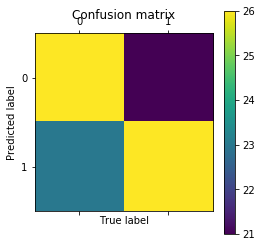

In [236]:
gb_y_proba_e = gb_e.predict_proba(X_test_e)[:,1]
gb_y_pred_e = gb_e.predict(X_test_e)


show_score(gb_e)
plot_roc_curve(y_test_e, gb_y_pred_e, gb_y_proba_e)

### XGBoost

In [238]:
xg_e = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
            colsample_bytree=0.5, gamma=0.4, learning_rate=0.28, max_delta_step=0.06,
           max_depth=7, min_child_weight=2, missing=1, n_estimators=470,
           n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
           reg_alpha=0.0083, reg_lambda=1, scale_pos_weight=1, seed=42, 
           silent=True, subsample=0.7)
xg_e.fit(X_train_e, y_train_e)

[18:55:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:55:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.4, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.28, max_delta_step=0.06, max_depth=7,
              min_child_weight=2, missing=1, monotone_constraints='()',
              n_estimators=470, n_jobs=1, nthread=1, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0.0083,
              reg_lambda=1, scale_pos_weight=1, seed=42, silent=True,
              subsample=0.7, tree_method='exact', use_label_encoder=True,
              validate_parameters=1, ...)

Test Score 0.43004115226337447


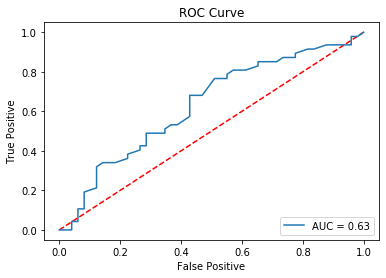

TP 24
TN 32
FP 17
FN 23
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.58      0.65      0.62        49
           1       0.59      0.51      0.55        47

    accuracy                           0.58        96
   macro avg       0.58      0.58      0.58        96
weighted avg       0.58      0.58      0.58        96



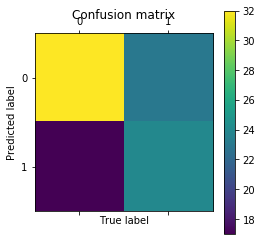

In [239]:
xg_y_proda_e = xg_e.predict_proba(X_test_e)[:, 1]
xg_y_pred_e = xg_e.predict(X_test_e)


show_score(xg_e)
plot_roc_curve(y_test_e, xg_y_pred_e, xg_y_proda_e)

### Random Forest + Gradient Boosting

In [240]:
tree_pipeline_e = [
    ('rf', rf_e),
    ('gb', gb_e),
]
rf_gb_e = VotingClassifier(tree_pipeline_e, voting='soft')
rf_gb_e.fit(X_train_e, y_train_e)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=None,
                                                     max_features='auto',
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     n_estimators=500,
                                                     n_jobs=-1, oob_score

In [241]:
rf_gb_y_proda_e = rf_gb_e.predict_proba(X_test_e)[:, 1]
rf_gb_y_pred_e = rf_gb_e.predict(X_test_e)

Test Score 0.4403292181069959


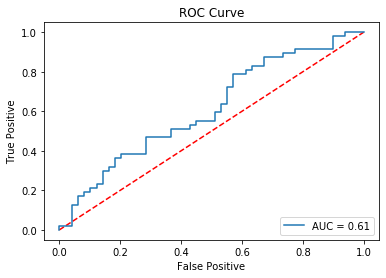

TP 27
TN 24
FP 25
FN 20
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.55      0.49      0.52        49
           1       0.52      0.57      0.55        47

    accuracy                           0.53        96
   macro avg       0.53      0.53      0.53        96
weighted avg       0.53      0.53      0.53        96



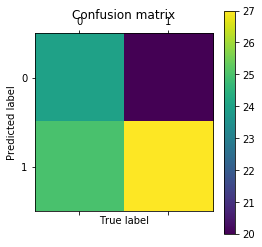

In [242]:
show_score(rf_gb_e)
plot_roc_curve(y_test_e, rf_gb_y_pred_e, rf_gb_y_proda_e)

### Convolutional Neural Network

In [254]:
cnn_e = Sequential()
cnn_e.add(Conv2D(126, (3, 3), input_shape=(1, 128, 128), data_format='channels_first'))
cnn_e.add(Activation('relu'))
cnn_e.add(MaxPooling2D(pool_size=(2, 2)))
cnn_e.add(Dropout(0.35))

cnn_e.add(Conv2D(126, (3, 3)))
cnn_e.add(Activation('relu'))
cnn_e.add(MaxPooling2D(pool_size=(2, 2)))
cnn_e.add(Dropout(0.35))

# 2 Fully connected layers
cnn_e.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
cnn_e.add(Dense(64)) 
cnn_e.add(Activation('relu'))
cnn_e.add(Dropout(0.5))
cnn_e.add(Dense(1))
cnn_e.add(Activation('sigmoid'))

cnn_e.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [255]:
X_train_keras_e, X_test_keras_e, y_train_keras_e, y_test_keras_e = preprocess_keras(X_e, y_e)

------
X (480, 16384)
y (480,)


In [256]:
datagen_e = ImageDataGenerator(
    rotation_range=10,
    horizontal_flip=True,
    vertical_flip=True)

history_e = cnn_e.fit_generator(
    datagen_e.flow(X_train_keras_e, y_train_keras_e, batch_size=126),
    epochs=50,
    verbose=1,
    validation_data=(X_test_keras_e, y_test_keras_e) 
    )

  ...
    to  
  ['...']
Train for 4 steps, validate on 96 samples
Epoch 1/50
4/4 [==============================] - 185s 46s/step - loss: 65.3104 - accuracy: 0.5234 - val_loss: 1.4608 - val_accuracy: 0.5104
Epoch 2/50
4/4 [==============================] - 185s 46s/step - loss: 3.5479 - accuracy: 0.4974 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/50
4/4 [==============================] - 101s 25s/step - loss: 0.6935 - accuracy: 0.5052 - val_loss: 0.6930 - val_accuracy: 0.4896
Epoch 4/50
4/4 [==============================] - 82s 21s/step - loss: 0.6935 - accuracy: 0.5026 - val_loss: 0.6929 - val_accuracy: 0.4896
Epoch 5/50
4/4 [==============================] - 64s 16s/step - loss: 0.6884 - accuracy: 0.5052 - val_loss: 0.6930 - val_accuracy: 0.4896
Epoch 6/50
4/4 [==============================] - 69s 17s/step - loss: 0.6951 - accuracy: 0.5078 - val_loss: 0.6931 - val_accuracy: 0.4896
Epoch 7/50
4/4 [==============================] - 95s 24s/step - loss: 0.6921 - accuracy: 0.507

In [257]:
cnn_e.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 126, 126, 126)     1260      
_________________________________________________________________
activation_24 (Activation)   (None, 126, 126, 126)     0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 63, 63, 126)       0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 63, 63, 126)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 61, 61, 126)       143010    
_________________________________________________________________
activation_25 (Activation)   (None, 61, 61, 126)       0         
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 30, 30, 126)      

In [258]:
cnn_score_e = cnn_e.evaluate(X_test_keras_e, y_test_keras_e, verbose=1)

96/96 [==============================] - 7s 69ms/sample - loss: 1.1237 - accuracy: 0.5312


In [259]:
print('Test loss:', cnn_score_e[0])
print('Test accuracy:', cnn_score_e[1])

Test loss: 1.12370898326238
Test accuracy: 0.53125


In [260]:
cnn_model_y_proba_e = cnn_e.predict(X_test_keras_e, verbose=1)
cnn_model_y_pred_e = cnn_e.predict_classes(X_test_keras_e, verbose=1)

96/96 [==============================] - 5s 56ms/sample


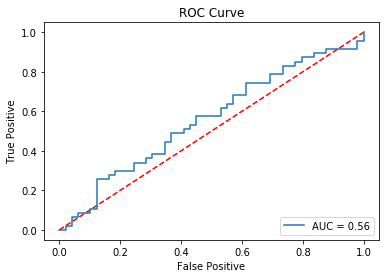

TP 28
TN 23
FP 26
FN 19
top left: TN
bottom left: FP
top right: FN
bottom right: TP
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.55      0.47      0.51        49
           1       0.52      0.60      0.55        47

    accuracy                           0.53        96
   macro avg       0.53      0.53      0.53        96
weighted avg       0.53      0.53      0.53        96



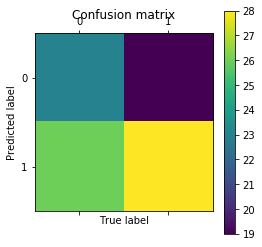

In [261]:
plot_roc_curve(y_test_keras_e, cnn_model_y_pred_e, cnn_model_y_proba_e)

## So this didn't turn out the way I expected it...

My plan was to try this on the three different levels of of difficulty and see how the model works, if it's able to make the distinction properly or not. <br>
I thought it will perform as well as it did with the previous dataset, alas I was wrong... <br>Disappointing as it is, I decided to move forward and do some more research. 

I searched for other algorythems that I haven't used here, that's when I stumbled upon<b> Resnet50.

## Simple Image Classification with ResNet-50


ResNet-50 is a pretrained Deep Learning model for image classification of the Convolutional Neural Network, which is a class of deep neural networks, most commonly applied to analyzing visual imagery.<br> ResNet-50 is 50 layers deep and is trained on a million images of 1000 categories from the ImageNet database (The ImageNet project is a large visual database designed for use in visual object recognition software research). Furthermore the model has over 23 million trainable parameters, which indicates a deep architecture that makes it better for image recognition.<br><br> Using a pretrained model is a highly effective approach, compared if you need to build it from scratch, where you need to collect great amounts of data and train it yourself. Of course, there are other pretrained deep models to use such as AlexNet, GoogleNet or VGG19, but the ResNet-50 is noted for excellent generalization performance with fewer error rates on recognition tasks and is therefore a useful tool to know.

#### Architecture of ResNet-50

ResNet stands for Residual Network and more specifically it is of a Residual Neural Network architecture. What characterizes a residual network is its identity connections.
Specifically, the ResNet-50 model consists of 5 stages each with a residual block. Each residual block has 3 layers with both 1 * 1 and 3 * 3 convolutions. The concept of residual blocks is quite simple. In traditional neural networks, each layer feeds into the next layer. In a network with residual blocks, each layer feeds into the next layer and directly into the layers about 2–3 hops away, called identity connections.

### Libraries

In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras import Sequential
import tensorflow as tf
import cv2
import os

### Prepare Model 

In [19]:
NEW_PROJECT_DIR = "C:/Users/Lidor/Documents/project/try/"
E = "easy"
M = "mid"
H = "hard"

In [20]:
train_datagen = ImageDataGenerator(horizontal_flip=True,
                                   vertical_flip=False,
                                   rescale=1./255,
                                   validation_split=0.2
                                   )

ResNet = ResNet50(input_shape=(96, 96, 3),
                          include_top=False,
                          weights='imagenet'
                          )

average_layer = GlobalAveragePooling2D()

model = Sequential([
    ResNet,
    average_layer,
    Dense(256, activation=tf.nn.relu),
    BatchNormalization(),
    Dropout(0.2),
    Dense(2, activation=tf.nn.softmax)
])

model.summary()

model.compile(optimizer=Adam(lr=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

def scheduler(epoch):
    if epoch <= 2:
        return 0.001
    elif epoch > 2 and epoch <= 15:
        return 0.0001 
    else:
        return 0.00001

lr_callbacks = tf.keras.callbacks.LearningRateScheduler(scheduler)


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 3, 3, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               524544    
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 514       
Total params: 24,113,794
Trainable params: 24,060,162
Non-trainable params: 53,632
_____________________________________

## Easy Category

In [21]:
dataset_path = NEW_PROJECT_DIR + E

train = train_datagen.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset='training')

test = train_datagen.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset='validation')

Found 1057 images belonging to 2 classes.
Found 264 images belonging to 2 classes.


In [22]:
model.fit(train,
        epochs=20,
        callbacks=[lr_callbacks],
        validation_data = test)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 34 steps, validate for 9 steps
Epoch 1/20
34/34 [==============================] - 227s 7s/step - loss: 0.9166 - accuracy: 0.6026 - val_loss: 2220.1230 - val_accuracy: 0.8182
Epoch 2/20
34/34 [==============================] - 213s 6s/step - loss: 0.5712 - accuracy: 0.7493 - val_loss: 1886.8205 - val_accuracy: 0.1818
Epoch 3/20
34/34 [==============================] - 161s 5s/step - loss: 0.5086 - accuracy: 0.7928 - val_loss: 400.4232 - val_accuracy: 0.8182
Epoch 4/20
34/34 [==============================] - 164s 5s/step - loss: 0.4794 - accuracy: 0.8136 - val_loss: 55.3121 - val_accuracy: 0.8182
Epoch 5/20
34/34 [==============================] - 160s 5s/step - loss: 0.4959 - accuracy: 0.8061 - val_loss: 12.0156 - val_accuracy: 0.8182
Epoch 6/20
34/34 [==============================] - 160s 5s/step - loss: 0.4498 - accuracy: 0.8184 - val_loss: 4.5012 - val_accuracy: 0.8182
Epoch 7/20
34/34 [==============================] - 1

In [36]:
e = model.evaluate(test)

print('Test loss:', e[0])
print('Test accuracy:', e[1])

  ...
    to  
  ['...']
9/9 [==============================] - 7s 820ms/step - loss: 2.3093 - accuracy: 0.8182
Test loss: 2.3093322780397205
Test accuracy: 0.8181818


### Mid Category 

In [73]:
dataset_path = NEW_PROJECT_DIR + M

train = train_datagen.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset='training')

test = train_datagen.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset='validation')

Found 1249 images belonging to 2 classes.
Found 312 images belonging to 2 classes.


In [75]:
model.fit(train,
        epochs=20,
        callbacks=[lr_callbacks],
        validation_data = test)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 40 steps, validate for 10 steps
Epoch 1/20
40/40 [==============================] - 94s 2s/step - loss: 0.7438 - accuracy: 0.6805 - val_loss: 2271.0383 - val_accuracy: 0.6923
Epoch 2/20
40/40 [==============================] - 135s 3s/step - loss: 0.6516 - accuracy: 0.6869 - val_loss: 1049921.1500 - val_accuracy: 0.3077
Epoch 3/20
40/40 [==============================] - 127s 3s/step - loss: 0.6207 - accuracy: 0.6869 - val_loss: 23071.1258 - val_accuracy: 0.3077
Epoch 4/20
40/40 [==============================] - 115s 3s/step - loss: 0.6341 - accuracy: 0.6837 - val_loss: 35.8380 - val_accuracy: 0.4391
Epoch 5/20
40/40 [==============================] - 142s 4s/step - loss: 0.5895 - accuracy: 0.6950 - val_loss: 2.4277 - val_accuracy: 0.6827
Epoch 6/20
40/40 [==============================] - 117s 3s/step - loss: 0.6026 - accuracy: 0.6950 - val_loss: 1.0683 - val_accuracy: 0.7019
Epoch 7/20
40/40 [==============================]

In [76]:
m = model.evaluate(test)

print('Test loss:', m[0])
print('Test accuracy:', m[1])

  ...
    to  
  ['...']
10/10 [==============================] - 8s 836ms/step - loss: 0.6294 - accuracy: 0.6635
Test loss: 0.6294160842895508
Test accuracy: 0.66346157


### Hard Category

In [77]:
dataset_path = NEW_PROJECT_DIR + H

train = train_datagen.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset='training')

test = train_datagen.flow_from_directory(dataset_path,
                                          class_mode="binary",
                                          target_size=(96, 96),
                                          batch_size=32,
                                          subset='validation')

Found 1057 images belonging to 2 classes.
Found 264 images belonging to 2 classes.


In [79]:
model.fit(train,
        epochs=20,
        callbacks=[lr_callbacks],
        validation_data = test)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 34 steps, validate for 9 steps
Epoch 1/20
34/34 [==============================] - 96s 3s/step - loss: 0.4972 - accuracy: 0.8079 - val_loss: 0.5458 - val_accuracy: 0.8182
Epoch 2/20
34/34 [==============================] - 129s 4s/step - loss: 0.4753 - accuracy: 0.8117 - val_loss: 0.5296 - val_accuracy: 0.8182
Epoch 3/20
34/34 [==============================] - 104s 3s/step - loss: 0.4555 - accuracy: 0.8108 - val_loss: 0.5033 - val_accuracy: 0.8144
Epoch 4/20
34/34 [==============================] - 121s 4s/step - loss: 0.4708 - accuracy: 0.8108 - val_loss: 0.5114 - val_accuracy: 0.8030
Epoch 5/20
34/34 [==============================] - 111s 3s/step - loss: 0.4420 - accuracy: 0.8108 - val_loss: 0.4728 - val_accuracy: 0.8182
Epoch 6/20
34/34 [==============================] - 104s 3s/step - loss: 0.4183 - accuracy: 0.8165 - val_loss: 0.4626 - val_accuracy: 0.8106
Epoch 7/20
34/34 [==============================] - 129s 4s/step

In [80]:
h = model.evaluate(test)

print('Test loss:', h[0])
print('Test accuracy:', h[1])

  ...
    to  
  ['...']
9/9 [==============================] - 23s 3s/step - loss: 0.5211 - accuracy: 0.7765
Test loss: 0.5210586289564768
Test accuracy: 0.7765151


### ResNet Summary

In [81]:
print("Test accuracy for the EASY category:")
print(e[1])
print("Test accuracy for the MID category:")
print(m[1])
print("Test accuracy for the HARD category:")
print(h[1])

Test accuracy for the EASY category:
0.8181818
Test accuracy for the MID category:
0.66346157
Test accuracy for the HARD category:
0.7765151


# GRAND SUMMARY

Starting this project, I had the objective of finding a classifying model that would perform well enough to reveal whether a given photo had been edited or not.<br> <br>
Why do I think such a model should be available? The world we live in today has come to rely on the internet so widely that we find ourselves spending so much time in the digital world. We are exposed to new content every day, such content that comes in written text, photos, or videos. As adults we are expected to be well educated enough to be able to tell what is real and what is not, when it comes to photos. But the truth is, the naked eye is easily outsmarted by the simple editing techniques that are widely used today. Not only us adults are easily outsmarted, but also children. Instagram is the number one platform for sharing photos today, it is used by people of all ages. Many edited photos are uploaded on Instagram daily, such edited photos that make all flaws disappear as if they never existed. This creates a false reality, people (children included) become insecure about themselves and stride to an unrealistic ideal od looks, of beauty. Sometimes, all we need is a simple reminder that what we see in these photos is not necessarily real, perhaps a simple marker that implies whether a photo was edited or not would do the trick. This why I see such significance in a model that will be able to make that classification. <br><br>
I started out with the idea of performing pre-processing on the images in the form of ELA in order to test different algorithms. I has two datasets to work with – one was the dataset of images that I took (unedited) vs the fake images from a photoshop thread on Imgur, the other was a dataset of faces that were edited in and categorized according to how hard it was to identify the editing. I chose to work on both datasets because I wanted to see whether the model would perform well on both types – whether it is able to classify properly what I intended for it to classify. <br><br>
The first dataset performed not so bad (yet not that good either…) with an accuracy of 0.81 at most with LR. I went on to do the same on the second dataset, this is where I was disappointed by the epic failure of the accuracy on these. At most I reached a 0.5 accuracy on the second dataset while working only on the easy category! I decided not to proceed to the harder categories as I saw no point since it did not perform well on the easy category.<br><br>
This made me realize that indeed the classification of the first dataset might have been wrong – that it might have picked up on something else that would classify the images, something that is unrelated to the fact that they were edited, which proves that this dataset was indeed quite lousy and didn’t match the objective. <br><br>
I decided to go back online and try and find something else, another model that might perform better and start off from the top with the second dataset. This is when I found ResNet-50, and I decided to give it a try. I tested it on each category and the results turned out better than the previous model:<br><br>
Easy category – 0.81 accuracy<br>
Mid category - 0.66 accuracy<br>
Hard category – 0.77 accuracy<br><br>
These results are not so bad, but they are a definite improvement from the previous model. In order to create a well performing model to distinguish edited images from real one’s further work is required, but I guess this is a nice start. Maybe someday, such marker to distinguish edited images from real ones will be available on social media so that people won’t be so easily deceived.
